# Demonstration of Spectral Processing With `NMRflux`
2025-02-08 Marcel Utz, KIT

## Synopsis
`NMRflux` is a Julia package for handling NMR data. It provides a basic
data structure that is designed to hold NMR data of any type and format.
It holds an ``n``-dimensional array of amplitude values along
with a list of axes. The axes have to be vectors of the same
length as the corresponding dimension of the data array. This structure is capable of handling axes with numerical meaning (time,
frequency, ...), but also lists (sample ID, compound name, experiment
ID, etc). 

`NMRflux` provides processing tools that act on this type of data structure. They can make use of the axis information. For example, a Fourier transform will convert the axis of the time domain data into
a corresponding frequency axis based on the Nyqvist theorem. This notebook provides an illustration of the usage of `NMRflux` to process
1D NMR data.

## Loading `NMRflux`
To load `NMRflux`, we activate a Julia environment that contains the module as a dependency, and then import the module as usual in Julia. We also import ancillary modules that we will need, such as `Plots.jl`.

In [1]:
import Pkg; Pkg.activate("./")
using NMRflux
import Plots

  Activating project at `~/Dropbox/Source/NMRflux.jl/demo`


## Loading NMR data
`NMRflux` comes with a range of example data sets to support testing, 
demonstrations, and training. They can be accessed through the submodule `NMRflux.Examples`. The interface provides the names and paths of files that can be loaded as follows:

In [2]:
NMRflux.Examples.Data

Dict{String, Dict{String, Any}} with 3 entries:
  "HCC cell culture media spectra" => Dict("name"=>"HCC cell culture media spec…
  "DMEM culture medium"            => Dict("name"=>"DMEM culture medium", "form…
  "Spheroid culture medium"        => Dict("name"=>"Spheroid culture medium", "…

In [3]:
ex=NMRflux.Examples.Data["Spheroid culture medium"]["files"][1]
println(ex)
params,d=NMRflux.load(ex,:JEOL) ;

/Users/mu3q/Dropbox/Source/NMRflux.jl/src/../examples/2025-03-18 spheroid culture/yp-5-fu-2.5-100.jdf


In [4]:
d

23072-element SpectData{ComplexF64, 1} with coords:(0.0:8.879999999999999e-5:2.0487048,):
  -2.1497944882665717e-7 - 7.707002455031156e-6im
 -0.00013950422110987898 - 0.00017234635428217768im
  -0.0051844162649977935 - 0.05157299135423599im
    -0.08807038729465194 - 0.21358801463142338im
    -0.08907652978845076 + 0.1320968426880609im
    -0.06816492160840142 - 0.2336285920028921im
     -0.1196864118719773 + 0.25899468673315246im
     0.02066485740608047 - 0.14237400938472022im
    -0.20010019956661748 + 0.028457352931816903im
      0.1504551844350158 + 0.4376629340060086im
    -0.19124221057796334 - 0.765504975825534im
        0.20992537751912 + 1.4791690016991144im
   -0.047071909431525054 - 1.9774632039570033im
                         ⋮
    -0.20194156131318705 + 0.08764223565952013im
    -0.07157211208141488 + 0.2184385331048646im
      0.1368540413231301 + 0.24293406484935914im
      0.2219324698160381 + 0.06486871065502277im
     0.24239250519559702 - 0.1211813507594912im
     

Here is the transmitter base frequency:

In [5]:
PPM=params["TRI_FREQ"][3]/1.0e6

600.17230460376

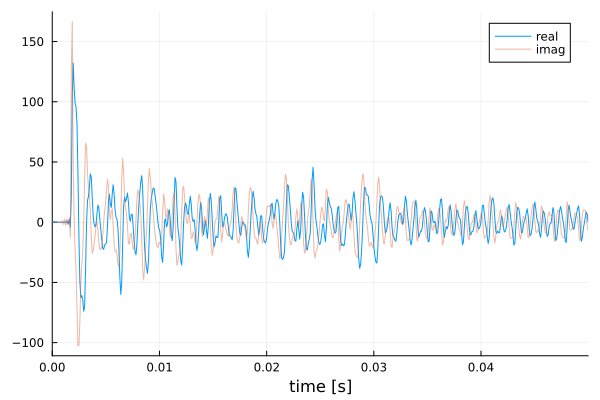

In [6]:
Plots.plot(coords(d,1), real(d),xlabel="time [s]",label="real",seriestype=:line) 
Plots.plot!(coords(d,1), imag(d),xlabel="time [s]",opacity=0.5,label="imag",xlims=[0,0.05]) 

## Processing NMR data
To process the data, we set up a processing chain, consisting of the
indivdual processing steps. In this case, we zero-fill the data to
64k (``2^{16}``) points, apodize it with a rate of ``0.5\pi\,\mathrm{s^{-1}}``, and then Fourier transform.

In [7]:
process = Chain(
    ZeroFill([2^17]),
    Apodize([0.5π]),
    FourierTransform([2^17],[1]),
    PhaseCorrect(-0.55pi,2pi*0.00175,1),
)

PhaseCorrect(-1.7278759594743864, 0.010995574287564275, 1) ∘ FourierTransform(Integer[1], Integer[131072], true, FFTW forward plan for 131072-element array of ComplexF64
(dft-ct-dit/32
  (dftw-direct-32/8 "t3fv_32_neon")
  (dft-vrank>=1-x32/1
    (dft-ct-dit/32
      (dftw-direct-32/8 "t3fv_32_neon")
      (dft-direct-128-x32 "n1fv_128_neon"))))) ∘ Apodize(Union{Colon, Real}[1.5707963267948966]) ∘ ZeroFill(Union{Colon, Integer}[131072])

`process()` is now a function that we can directly apply to the experimental data. This results in a new `SpectData` object that has its horizontal coordinate
calibrated in Hz:

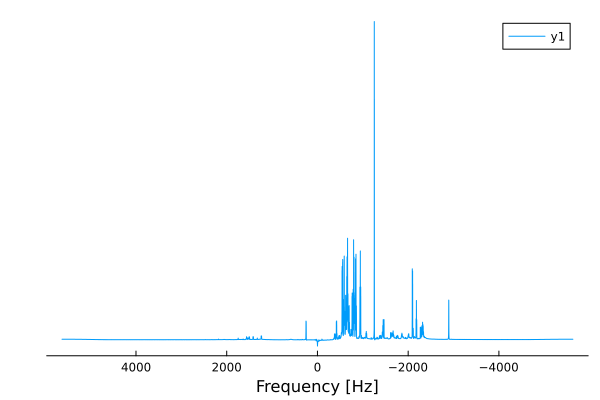

In [8]:
s = d |> process
s ./= sqrt(sum(s.*conj(s)))
Plots.plot(coords(s,1), real(s),xaxis=:flip,xlabel="Frequency [Hz]",yaxis=false,grid=false)
# s =  sqrt(sum(conj(s).*s))

we can use the coordinate to plot the data over the more familiar ppm scale. 
For this, we need the number of Hz that correspond to 1 ppm. For the Bruker data,
this is found in the parameter `"SFO0"`, which indicates the absolute
frequency of the carrier signal, in the center of the spectrum. In the present example,
the centre of the spectrum corresponds to the water resonance, which appears at 4.8 ppm. We shift
the axis to reflect this.

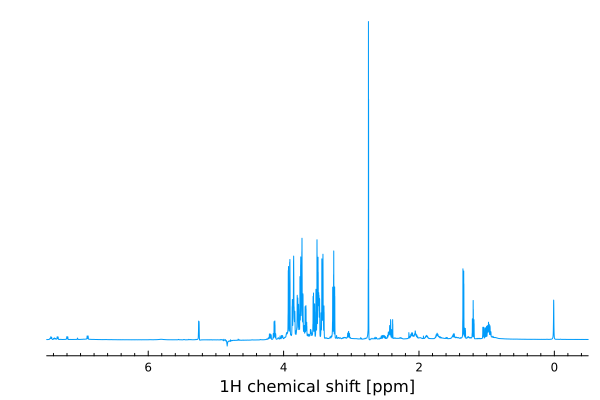

In [9]:
Plots.plot(
    coords(s,1) / 600 .+ 4.835,
    real(s),
    xaxis=:flip, xlabel = "1H chemical shift [ppm]", xlims=[-0.5,7.5],
    label=nothing,
    grid=false,
    yaxis=false,
    minorticks=10
)

## Computing Integrals
The integral of the spectrum can be computed using the `cumsum` function, which is part of the Julia Base.


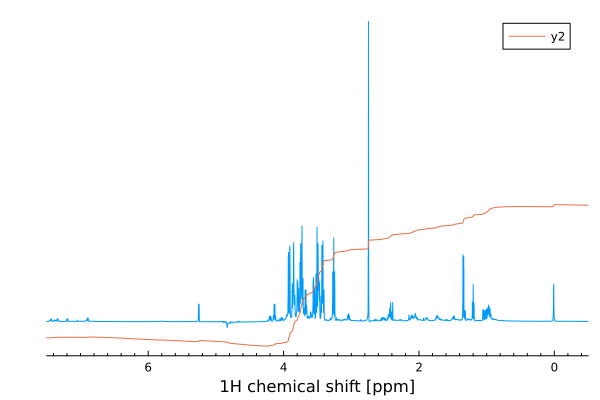

In [10]:
Plots.plot!(reverse(coords(s,1)) / 600 .+ 4.835, 1e-3*cumsum(real.(reverse(s))))

This is not a very convincing result, since the baseline of the spectrum is not yet well adjusted. 

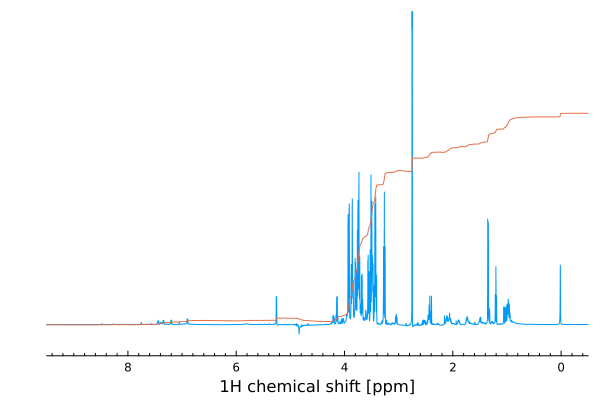

In [11]:
mb=NMRflux.MedianBaselineCorrect(1,wdw=2<<12)
smb = s |> mb

Plots.plot(
    coords(smb,1) / 600 .+ 4.84,
    real(smb),
    xaxis=:flip, xlabel = "1H chemical shift [ppm]", xlims=[-0.5,9.5],
    label=nothing,
    grid=false,
    yaxis=false,ylims=0.06*[-0.1,1.0],
    minorticks=10,
)

Plots.plot!(reverse(coords(smb,1)) / 600 .+ 4.84, 1.0e-3*cumsum(real.(reverse(smb))),label=false)

## Loading a batch of data
Often we are dealing not only with a single spectrum, but an entire batch of them, collected for example over the course of time, or
pertaining to a batch of experiments. In this case, it may make sense to condense the individual data into a 2D set. This can be done
as follows:

In [12]:
dall=[ load(f,:Bruker)[2] for f in NMRflux.Examples.Data["HCC cell culture media spectra"]["files"] ]


43-element Vector{SpectData{ComplexF64, 1}}:
 [-6.9423121078125e7 + 1.047522298828125e8im, 3.713936376171875e8 - 5.873334321640625e8im, 4.89205430609375e8 - 1.33556210878125e9im, 1.36027642265625e7 - 1.0152351535234375e9im, -5.90617235546875e7 - 8.273014788203125e8im, -8.6232552546875e7 - 5.643557254375e8im, -398472.4296875 - 5.26599649140625e8im, -1.78959229921875e7 - 4.263141174296875e8im, 1.67038894921875e7 - 3.65753820171875e8im, 4.84514783984375e7 - 2.174211429765625e8im  …  -416306.875 - 498250.46875im, -283007.765625 - 183694.90625im, -420138.875 + 79240.765625im, -175130.375 + 254453.578125im, -25309.578125 + 487678.984375im, 0.0 + 0.0im, 0.0 + 0.0im, 0.0 + 0.0im, 0.0 + 0.0im, 0.0 + 0.0im]
 [-6.73282561328125e7 + 1.239938218125e8im, 3.583411114140625e8 - 6.944526417890625e8im, 4.41280862765625e8 - 1.559643875390625e9im, -4.0729339203125e7 - 1.1775226735859375e9im, -9.28869306328125e7 - 9.791675433671875e8im, -8.57148132578125e7 - 7.056673025078125e8im, 1.4833451578125e7 - 7.031

In [13]:
td=coords(first(dall),1)
batchd=SpectData(cat(dall...,dims=2),(td,1:43))

32693×43 SpectData{ComplexF64, 2} with coords:(0.0:7.199999999999995e-5:2.353823999999998, 1:43):
 -6.94231e7+1.04752e8im  -6.73283e7+1.23994e8im  …  -6.75378e7+1.25927e8im
  3.71394e8-5.87333e8im   3.58341e8-6.94453e8im      3.59548e8-7.05231e8im
  4.89205e8-1.33556e9im   4.41281e8-1.55964e9im      4.43337e8-1.58147e9im
  1.36028e7-1.01524e9im  -4.07293e7-1.17752e9im     -3.81593e7-1.19508e9im
 -5.90617e7-8.27301e8im  -9.28869e7-9.79168e8im     -8.86054e7-9.99797e8im
 -8.62326e7-5.64356e8im  -8.57148e7-7.05667e8im  …  -8.25172e7-7.27249e8im
 -3.98472e5-5.266e8im     1.48335e7-7.03138e8im      1.56078e7-7.26248e8im
 -1.78959e7-4.26314e8im  -1.32973e7-6.18883e8im     -1.32801e7-6.39599e8im
  1.67039e7-3.65754e8im   5.52325e5-5.67147e8im       2.0492e6-5.87606e8im
  4.84515e7-2.17421e8im   2.54706e7-3.97925e8im      2.79948e7-4.19986e8im
  1.73915e8-1.47697e8im   1.62729e8-3.20319e8im  …   1.63629e8-3.45678e8im
  2.86027e8-9.70209e7im   2.91472e8-2.71591e8im      2.90155e8-2.96916e8im
  

In [14]:
process = Chain(
    ZeroFill([2^15,:]),
    Apodize([0.5π,:]),
    FourierTransform([2^15,43],[1]),
    PhaseCorrect(0.3pi,2pi*0.00006,1),
)

PhaseCorrect(0.9424777960769379, 0.0003769911184307752, 1) ∘ FourierTransform(Integer[1], Integer[32768, 43], true, FFTW forward plan for 32768×43 array of ComplexF64
(dft-vrank>=1-x43/1
  (dft-ct-dit/32
    (dftw-direct-32/8 "t3fv_32_neon")
    (dft-vrank>=1-x32/1
      (dft-ct-dit/32
        (dftw-direct-32/8 "t3fv_32_neon")
        (dft-direct-32-x32 "n2fv_32_neon")))))) ∘ Apodize(Union{Colon, Real}[1.5707963267948966, Colon()]) ∘ ZeroFill(Union{Colon, Integer}[32768, Colon()])

In [15]:
batchs = batchd |> process

32768×43 SpectData{ComplexF64, 2} with coords:(-6944.44444444445:0.423868187166628:6944.44444444445, 1:43):
  -3.6038e8-1.49322e8im  -4.20503e8-1.40454e8im  …  -4.29828e8-1.32748e8im
 -3.60267e8-1.49644e8im  -4.24506e8-1.3893e8im      -4.29683e8-1.34678e8im
 -3.60169e8-1.51708e8im  -4.23923e8-1.35077e8im     -4.30067e8-1.33364e8im
 -3.62771e8-1.56028e8im  -4.22033e8-1.33551e8im     -4.28746e8-1.30088e8im
 -3.67966e8-1.50229e8im  -4.22912e8-1.36345e8im     -4.27325e8-1.34462e8im
 -3.67676e8-1.49559e8im  -4.23252e8-1.33533e8im  …  -4.28314e8-1.35491e8im
 -3.67912e8-1.47253e8im  -4.23531e8-1.34595e8im     -4.30742e8-1.34677e8im
  -3.6995e8-1.47072e8im  -4.24823e8-1.3428e8im      -4.32311e8-1.33351e8im
 -3.69123e8-1.43394e8im  -4.26307e8-1.32912e8im     -4.33036e8-1.32921e8im
 -3.65834e8-1.41323e8im  -4.27239e8-1.31447e8im     -4.36312e8-1.32323e8im
 -3.66005e8-1.44604e8im  -4.26921e8-1.31597e8im  …  -4.36564e8-1.28558e8im
 -3.69174e8-1.44335e8im  -4.29313e8-1.31032e8im     -4.36537e8-1.27

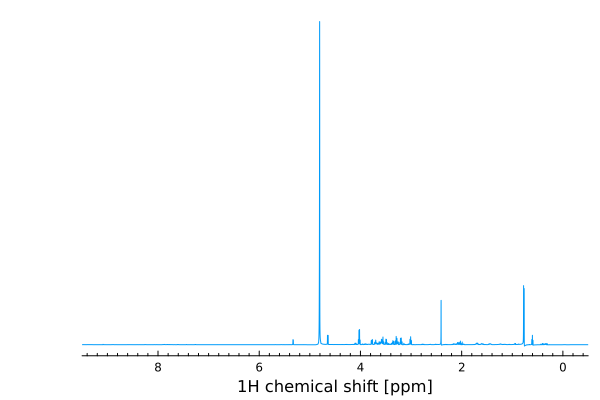

In [16]:
Plots.plot(
    coords(batchs,1)/600 .+ 4.8,
    real(batchs[:,8]),    
xaxis=:flip, xlabel = "1H chemical shift [ppm]", xlims=[-0.5,9.5],
label=nothing,
grid=false,
yaxis=false,
minorticks=10,)